# Capstone Project — Detecção de Doenças em Plantas (Detecção de Objetos)

**Processamento Digital de Imagens · Ciência da Computação — 8º Período**
Centro Universitário Dom Helder · Prof. Dr. Fischer Stefan
Dataset: **Plant Disease Detection** (Roboflow · formato YOLOv8 · *bounding boxes* por lesão)

---

| Bloco | Técnica |
|---|---|
| 1 | **Threshold & Blur** — suavização e limiarização |
| 2 | **Edge & Corner Detection** — Canny, Sobel, Harris, Shi-Tomasi |
| 3 | **Object Detection + ROI + Blend/Paste** — segmentação HSV + composição visual |
| 4 | **YOLOv8 (detecção)** — treinado para localizar lesões + comparação com HSV |

> Diferente de um dataset de classificação (uma pasta por classe), este dataset traz **caixas
> delimitadoras reais por lesão** (`labels/*.txt` no formato YOLO). Isso permite **treinar
> detecção de objetos** e medir a qualidade contra o *ground-truth* (IoU / recall / precisão).

> Execute **Run All**. Todos os resultados são salvos em `results/`.

In [ ]:
# ── Cole sua Private API Key do Roboflow aqui (roboflow.com -> Settings -> API) ──
ROBOFLOW_API_KEY = "API_KEY_AQUI"
# ─────────────────────────────────────────────────────────────────────────────

In [2]:
%matplotlib inline
import sys, os, glob, random, warnings
from pathlib import Path
warnings.filterwarnings('ignore')

# Raiz do projeto: sobe na arvore ate encontrar .git ou requirements.txt
def _achar_root():
    root = Path.cwd()
    while root != root.parent:
        if (root / '.git').exists() or (root / 'requirements.txt').exists():
            break
        root = root.parent
    return root

ROOT = _achar_root()
sys.path.insert(0, str(ROOT / 'src'))

import cv2
import numpy as np
import matplotlib.pyplot as plt

try:
    import yaml
except ImportError:
    yaml = None

# Operacoes de imagem (modulos que voce ja possui em src/)
from preprocessing import (
    converter_grayscale, aplicar_blur_gaussiano, aplicar_blur_mediano,
    aplicar_blur_bilateral, aplicar_threshold_simples,
    aplicar_threshold_otsu, aplicar_threshold_adaptativo_gaussiano,
)
from detection import (
    detectar_bordas_canny, detectar_bordas_sobel,
    detectar_cantos_harris, detectar_cantos_shi_tomasi,
    detectar_contornos_externos,
    segmentar_folha_verde, detectar_lesoes_hsv,
    destacar_regiao_doenca, compor_diagnostico_visual,
    aplicar_blur_em_roi,
)
from yolo_detection import (
    carregar_modelo_deteccao, carregar_modelo_custom,
    detectar_objetos, treinar_detector, avaliar_modelo,
    casar_caixas, iou_xyxy, comparar_metodos,
)

plt.rcParams.update({'figure.dpi': 100, 'figure.facecolor': 'white'})

TAMANHO     = (416, 416)
DATA_DIR    = str(ROOT / 'data')
RESULTS_DIR = str(ROOT / 'results')
os.makedirs(RESULTS_DIR, exist_ok=True)

# ── API minima de leitura do dataset (formato YOLOv8 / Roboflow) ──────────────

def caminho_data_yaml():
    return os.path.join(DATA_DIR, 'data.yaml')

def carregar_data_yaml():
    with open(caminho_data_yaml(), 'r', encoding='utf-8') as f:
        return yaml.safe_load(f)

def verificar_dataset():
    return (os.path.exists(caminho_data_yaml())
            and os.path.isdir(os.path.join(DATA_DIR, 'train', 'images')))

def listar_classes():
    cfg = carregar_data_yaml()
    nomes = cfg.get('names', [])
    if isinstance(nomes, dict):                       # formato {0: 'a', 1: 'b'}
        nomes = [nomes[k] for k in sorted(nomes, key=lambda x: int(x))]
    return list(nomes)

def nome_legivel(cls):
    return str(cls).replace('_', ' ').replace('-', ' ').strip().title()

def listar_imagens(split='train'):
    pasta = os.path.join(DATA_DIR, split, 'images')
    arquivos = []
    for e in ('*.jpg', '*.jpeg', '*.png', '*.bmp', '*.JPG', '*.PNG', '*.JPEG'):
        arquivos += glob.glob(os.path.join(pasta, e))
    return sorted(set(arquivos))

def caminho_label(img_path):
    base = os.path.splitext(os.path.basename(img_path))[0]
    pasta_labels = os.path.join(os.path.dirname(os.path.dirname(img_path)), 'labels')
    return os.path.join(pasta_labels, base + '.txt')

def ler_labels_yolo(img_path, shape):
    # Le o .txt YOLO (classe xc yc w h normalizados) -> (classe_id, x1, y1, x2, y2) em pixels.
    h, w = shape[:2]
    lp = caminho_label(img_path)
    caixas = []
    if not os.path.exists(lp):
        return caixas
    with open(lp, 'r', encoding='utf-8') as f:
        for linha in f:
            p = linha.split()
            if len(p) < 5:
                continue
            cid = int(float(p[0]))
            xc, yc, bw, bh = map(float, p[1:5])
            x1 = max(0, int((xc - bw / 2) * w)); y1 = max(0, int((yc - bh / 2) * h))
            x2 = min(w, int((xc + bw / 2) * w)); y2 = min(h, int((yc + bh / 2) * h))
            caixas.append((cid, x1, y1, x2, y2))
    return caixas

def carregar_imagem_rgb(img_path):
    bgr = cv2.imread(img_path)
    if bgr is None:
        raise FileNotFoundError(img_path)
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

def amostrar_imagens(n=8, split='train', com_label=True, semente=0):
    # Amostra n imagens; se com_label, prioriza imagens que possuem caixas anotadas.
    random.seed(semente)
    arquivos = listar_imagens(split)
    random.shuffle(arquivos)
    sel = []
    for p in arquivos:
        if com_label:
            lp = caminho_label(p)
            if not (os.path.exists(lp) and os.path.getsize(lp) > 0):
                continue
        sel.append(p)
        if len(sel) >= n:
            break
    if not sel:
        sel = arquivos[:n]
    return sel

def desenhar_boxes(img_rgb, caixas, classes=None, cor=(0, 160, 255), espessura=2):
    out = img_rgb.copy()
    for c in caixas:
        cid, x1, y1, x2, y2 = c
        cv2.rectangle(out, (x1, y1), (x2, y2), cor, espessura)
        rot = nome_legivel(classes[cid]) if (classes and 0 <= cid < len(classes)) else str(cid)
        cv2.putText(out, rot, (x1 + 2, max(14, y1 - 4)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.45, cor, 1)
    return out

def estatisticas_dataset():
    s = {'classes': listar_classes()}
    s['n_classes'] = len(s['classes'])
    for split in ('train', 'valid', 'test'):
        s[split] = len(listar_imagens(split))
    return s

def preparar_yaml_treino():
    # Reescreve um data.yaml com CAMINHOS ABSOLUTOS para o Ultralytics treinar sem erro de path.
    nomes = listar_classes()
    novo = {
        'path':  DATA_DIR,
        'train': 'train/images',
        'val':   'valid/images',
        'test':  'test/images',
        'nc':    len(nomes),
        'names': nomes,
    }
    destino = os.path.join(DATA_DIR, 'data_treino.yaml')
    with open(destino, 'w', encoding='utf-8') as f:
        yaml.safe_dump(novo, f, sort_keys=False, allow_unicode=True)
    return destino

# ── Helpers de plotagem ───────────────────────────────────────────────────────

def grade(imagens, titulos, cols=3, figsize=(15, 5), nome=None, dpi=100):
    n = len(imagens)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=figsize, dpi=dpi, squeeze=False)
    for i, ax in enumerate(axes.flatten()):
        if i < n:
            img = imagens[i]
            ax.imshow(img, cmap='gray' if len(img.shape) == 2 else None)
            ax.set_title(titulos[i], fontsize=10, pad=4)
        ax.axis('off')
    plt.tight_layout(pad=0.5)
    if nome:
        fig.savefig(os.path.join(RESULTS_DIR, nome), bbox_inches='tight', dpi=dpi)
        print(f'  Salvo -> results/{nome}')
    plt.show()
    plt.close(fig)

def sep(titulo):
    print(f'\n{"=" * 55}')
    print(f'  {titulo}')
    print('=' * 55)

import torch
gpu_ok = torch.cuda.is_available()
gpu_nome = torch.cuda.get_device_name(0) if gpu_ok else 'N/A'
print('Setup completo.')
print(f'ROOT        : {ROOT}')
print(f'DATA_DIR    : {DATA_DIR}')
print(f'RESULTS_DIR : {RESULTS_DIR}')
print(f'GPU (CUDA)  : {"sim — " + gpu_nome if gpu_ok else "nao disponivel — YOLO usara CPU (muito mais lento)"}')
if not gpu_ok:
    print('  -> Para habilitar GPU: instale CUDA e torch com suporte CUDA.')
    print('     Consulte: https://pytorch.org/get-started/locally/')

Setup completo.
ROOT        : c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project
DATA_DIR    : c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\data
RESULTS_DIR : c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results
GPU (CUDA)  : sim — NVIDIA GeForce RTX 4050 Laptop GPU


---
## 1 · Dataset Plant Disease Detection (Roboflow)

In [3]:
if verificar_dataset():
    print('Dataset ja disponivel em:', DATA_DIR)
    print(os.listdir(DATA_DIR))
else:
    from roboflow import Roboflow
    from pathlib import Path
    import os

    # root do projeto
    ROOT = Path.cwd()
    while ROOT != ROOT.parent:
        if (ROOT / ".git").exists() or (ROOT / "requirements.txt").exists():
            break
        ROOT = ROOT.parent

    DATA_DIR = ROOT / "data"
    DATA_DIR.mkdir(exist_ok=True)

    print("ROOT:", ROOT)
    print("DATA:", DATA_DIR)

    rf = Roboflow(api_key=ROBOFLOW_API_KEY)

    project = rf.workspace("detection-idqhz").project(
        "plant-disease-detection-4pmen"
    )

    version = project.version(6)

    dataset = version.download(
        model_format="yolov8",
        location=str(DATA_DIR),
        overwrite=True
    )

    print(dataset.location)

    # verifica arquivos
    print(os.listdir(DATA_DIR))

    DATA_DIR = str(DATA_DIR)   # volta a ser string para o restante do notebook

assert verificar_dataset(), 'Dataset nao encontrado em ' + str(DATA_DIR)

Dataset ja disponivel em: c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\data
['data.yaml', 'data_treino.yaml', 'README.dataset.txt', 'README.roboflow.txt', 'test', 'train', 'valid']


In [4]:
stats = estatisticas_dataset()
CLASSES = listar_classes()
total = stats['train'] + stats['valid'] + stats['test']

print(f"Classes : {stats['n_classes']}")
print(f"Train   : {stats['train']:,} imagens")
print(f"Valid   : {stats['valid']:,} imagens")
print(f"Test    : {stats['test']:,} imagens")
print(f"Total   : {total:,} imagens")
if total:
    print(f"Split   : {stats['train']/total*100:.0f}% train / "
          f"{stats['valid']/total*100:.0f}% val / {stats['test']/total*100:.0f}% test")
print()
print('Classes (lidas do data.yaml):')
for i, c in enumerate(CLASSES):
    print(f"  {i:>2}. {nome_legivel(c)}")

print()
# Agrupa por planta (primeira palavra do nome da classe)
grupos = {}
for c in CLASSES:
    planta = nome_legivel(c).split()[0]
    grupos.setdefault(planta, {'doencas': [], 'saudaveis': []})
    if 'healthy' in c.lower():
        grupos[planta]['saudaveis'].append(nome_legivel(c))
    else:
        grupos[planta]['doencas'].append(nome_legivel(c))

print('Distribuicao por planta:')
for planta, cats in sorted(grupos.items()):
    nd, ns = len(cats['doencas']), len(cats['saudaveis'])
    doencas_str = ', '.join(cats['doencas']) if cats['doencas'] else '-'
    print(f"  {planta:<8}: {nd} doenca(s)  [{doencas_str}]")
n_doentes = sum(len(v['doencas']) for v in grupos.values())
n_saud    = sum(len(v['saudaveis']) for v in grupos.values())
print()
print(f'  Classes de doenca   : {n_doentes} ({n_doentes/len(CLASSES)*100:.0f}%)')
print(f'  Classes saudaveis   : {n_saud} ({n_saud/len(CLASSES)*100:.0f}%)')
print()
print('Desafios especificos de cada doenca para PDI:')
print('  Apple cedar rust     -> manchas alaranjadas/ferruginosas na folha')
print('  Cherry powdery mildew-> po branco/cinza sobre a superfice foliar')
print('  Grape black rot      -> lesoes escuras arredondadas com halo amarelo')
print('  Tomato septoria      -> manchas circulares pequenas, centro claro com borda escura')
print()
print('Observacao: as doencas cobrem uma ampla variacao de cor (laranja, branco,')
print('preto, bege), o que favorece o YOLO treinado sobre o metodo classico HSV,')
print('que so detecta uma faixa de cor fixada manualmente.')

Classes : 8
Train   : 2,790 imagens
Valid   : 814 imagens
Test    : 396 imagens
Total   : 4,000 imagens
Split   : 70% train / 20% val / 10% test

Classes (lidas do data.yaml):
   0. Apple Cedar Rust
   1. Apple Healthy
   2. Cherry Healthy
   3. Cherry Powdery Mildew
   4. Grape Black Rot
   5. Grape Healthy
   6. Tomato Healthy
   7. Tomato Septoria Leaf Spot

Distribuicao por planta:
  Apple   : 1 doenca(s)  [Apple Cedar Rust]
  Cherry  : 1 doenca(s)  [Cherry Powdery Mildew]
  Grape   : 1 doenca(s)  [Grape Black Rot]
  Tomato  : 1 doenca(s)  [Tomato Septoria Leaf Spot]

  Classes de doenca   : 4 (50%)
  Classes saudaveis   : 4 (50%)

Desafios especificos de cada doenca para PDI:
  Apple cedar rust     -> manchas alaranjadas/ferruginosas na folha
  Cherry powdery mildew-> po branco/cinza sobre a superfice foliar
  Grape black rot      -> lesoes escuras arredondadas com halo amarelo
  Tomato septoria      -> manchas circulares pequenas, centro claro com borda escura

Observacao: as doe

  Salvo -> results/00_amostras_dataset.png


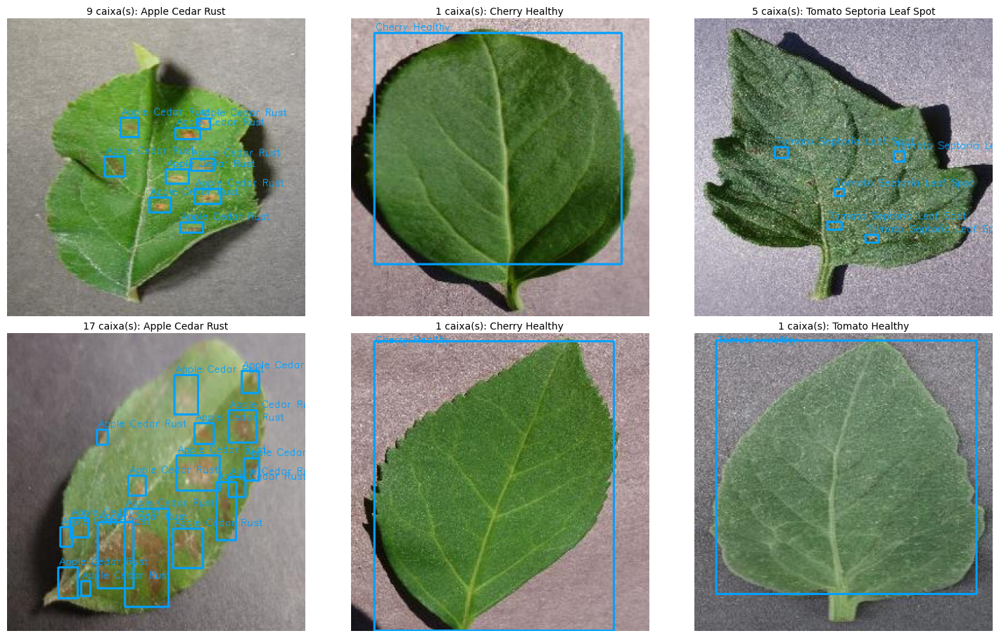

Caixas em laranja = ground-truth (anotacao manual do dataset).


In [5]:
# Amostras do dataset com as caixas REAIS (ground-truth) desenhadas
amostras_path = amostrar_imagens(n=6, split='train', com_label=True, semente=1)

imgs_grid, tits_grid = [], []
for p in amostras_path:
    im = cv2.resize(carregar_imagem_rgb(p), TAMANHO)
    gt = ler_labels_yolo(p, im.shape)
    imgs_grid.append(desenhar_boxes(im, gt, CLASSES))
    nomes_im = sorted({nome_legivel(CLASSES[c[0]]) for c in gt}) if gt else ['sem rotulo']
    rotulo = ', '.join(nomes_im)
    tits_grid.append(f"{len(gt)} caixa(s): {rotulo[:30]}")

grade(imgs_grid, tits_grid, cols=3, figsize=(15, 9), nome='00_amostras_dataset.png')
print('Caixas em laranja = ground-truth (anotacao manual do dataset).')

Amostra A (principal): e-226-_JPG.rf.229e93c5ab43ec678625d1b3c28af7bd.jpg
  20 caixas  ->  Grape Black Rot
Amostra B (comparacao): b-160-_JPG.rf.741a99384d05ebd61860ada25479919c.jpg
  1 caixas  ->  Apple Healthy
  Salvo -> results/00b_amostras_principais.png


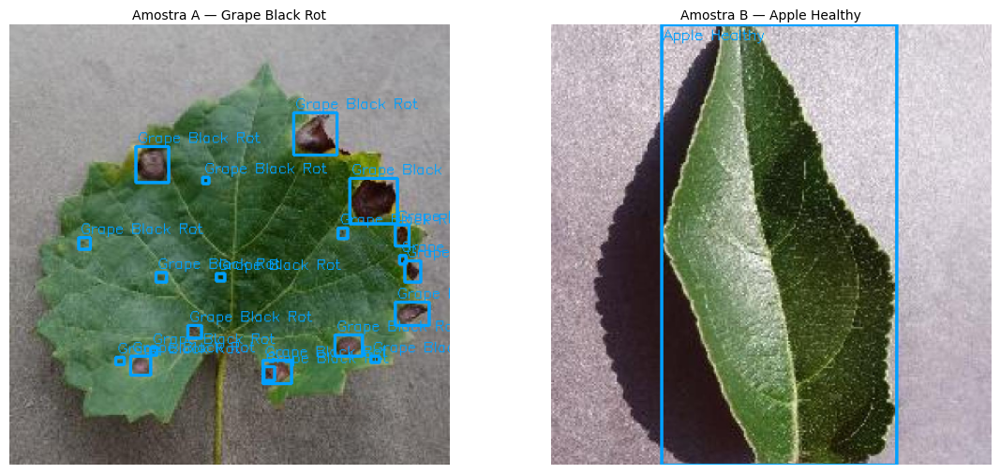

In [6]:
# Seleciona duas amostras de trabalho. A "Amostra A" (com mais caixas) sera a principal.
sel = amostrar_imagens(n=8, split='train', com_label=True, semente=7)
PATH_A, PATH_B = sel[0], sel[1]
IMG_A = cv2.resize(carregar_imagem_rgb(PATH_A), TAMANHO)
IMG_B = cv2.resize(carregar_imagem_rgb(PATH_B), TAMANHO)
GT_A  = ler_labels_yolo(PATH_A, IMG_A.shape)
GT_B  = ler_labels_yolo(PATH_B, IMG_B.shape)

if len(GT_B) > len(GT_A):                              # A = mais caixas
    IMG_A, IMG_B = IMG_B, IMG_A
    GT_A,  GT_B  = GT_B,  GT_A
    PATH_A, PATH_B = PATH_B, PATH_A

NOME_A = ', '.join(sorted({nome_legivel(CLASSES[c[0]]) for c in GT_A})) or 'sem rotulo'
NOME_B = ', '.join(sorted({nome_legivel(CLASSES[c[0]]) for c in GT_B})) or 'sem rotulo'

print('Amostra A (principal):', os.path.basename(PATH_A))
print(f'  {len(GT_A)} caixas  ->  {NOME_A}')
print('Amostra B (comparacao):', os.path.basename(PATH_B))
print(f'  {len(GT_B)} caixas  ->  {NOME_B}')

grade(
    [desenhar_boxes(IMG_A, GT_A, CLASSES), desenhar_boxes(IMG_B, GT_B, CLASSES)],
    [f'Amostra A — {NOME_A}'[:48], f'Amostra B — {NOME_B}'[:48]],
    cols=2, figsize=(12, 5), nome='00b_amostras_principais.png',
)

In [7]:
# Seleciona imagens especializadas por criterio mensuravel para cada bloco de demo
def _score(img_path, criterio):
    try:
        bgr = cv2.resize(cv2.imread(img_path), TAMANHO)
        if bgr is None: return 0
        g = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)
        if criterio == 'ruido':
            # Variancia do Laplaciano: alta = muita textura/ruido de alta frequencia
            return float(cv2.Laplacian(g, cv2.CV_64F).var())
        if criterio == 'contraste':
            # Produto das massas em cada metade do histograma: maximo quando bimodal
            h = np.histogram(g, bins=32)[0].astype(float)
            h /= h.sum() + 1e-9
            return float(h[:16].sum() * h[16:].sum())
        if criterio == 'bordas':
            # Total de pixels Canny: mais bordas = estrutura mais rica
            b = cv2.GaussianBlur(g, (5, 5), 0)
            return float(cv2.Canny(b, 50, 150).sum())
    except Exception:
        return 0

random.seed(0)
_pool = listar_imagens('train')
random.shuffle(_pool)
# Candidatos: primeiras 80 imagens com pelo menos uma caixa anotada
_pool = [p for p in _pool[:80]
         if os.path.exists(caminho_label(p)) and os.path.getsize(caminho_label(p)) > 0]

_r = max(_pool, key=lambda p: _score(p, 'ruido'))
_c = max(_pool, key=lambda p: _score(p, 'contraste'))
_e = max(_pool, key=lambda p: _score(p, 'bordas'))

IMG_NOISY    = cv2.resize(carregar_imagem_rgb(_r), TAMANHO)
IMG_CONTRAST = cv2.resize(carregar_imagem_rgb(_c), TAMANHO)
IMG_EDGE     = cv2.resize(carregar_imagem_rgb(_e), TAMANHO)

print('Imagens selecionadas automaticamente por criterio:')
print(f'  Blur      (max Laplacian var)  : {os.path.basename(_r)}')
print(f'  Threshold (max bimodalidade)   : {os.path.basename(_c)}')
print(f'  Canny     (max pixels de borda): {os.path.basename(_e)}')

Imagens selecionadas automaticamente por criterio:
  Blur      (max Laplacian var)  : g-446-_JPG.rf.af214ab183aae130595a75a5538681cf.jpg
  Threshold (max bimodalidade)   : b-277-_JPG.rf.6e95a09a6b7360bf37de0d1e8e814aed.jpg
  Canny     (max pixels de borda): g-267-_JPG.rf.29b85bdc6f3a7f997da64bd69df173cc.jpg


---
## 2 · Bloco 1 — Threshold & Blur

Suavização para reduzir ruído e limiarização para segmentar regiões.
Comparamos blur (Gaussian, Median, Bilateral) e limiarização (Simples, Otsu, Adaptativo).

  Salvo -> results/01_blur_comparacao.png


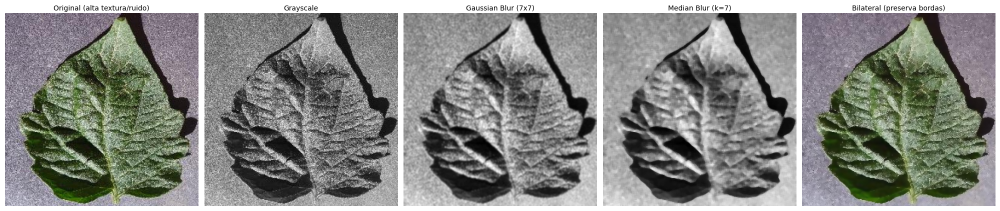

In [8]:
gray = converter_grayscale(IMG_A)   # preservado para o bloco de threshold adiante

# Demo com a imagem de maior variancia de Laplaciano (mais textura/ruido)
gray_n     = converter_grayscale(IMG_NOISY)
b_gauss_n  = aplicar_blur_gaussiano(gray_n, kernel=(7, 7))
b_median_n = aplicar_blur_mediano(gray_n, ksize=7)
b_bilat_n  = aplicar_blur_bilateral(IMG_NOISY)

grade(
    [IMG_NOISY, gray_n, b_gauss_n, b_median_n, b_bilat_n],
    ['Original (alta textura/ruido)', 'Grayscale',
     'Gaussian Blur (7x7)', 'Median Blur (k=7)', 'Bilateral (preserva bordas)'],
    cols=5, figsize=(20, 4),
    nome='01_blur_comparacao.png',
)

In [9]:
sep('Analise: Blur como redutor de ruido')

std_orig  = float(gray_n.std())
std_gauss = float(b_gauss_n.std())
std_med   = float(b_median_n.std())

print('Como foi calculado:')
print('  std = desvio padrao dos valores de pixel.')
print('  Ruido = pixels vizinhos com valores muito diferentes -> std alto.')
print('  Blur faz medias de vizinhancas -> pixels ficam parecidos -> std cai.')
print()
print(f'  Desvio padrao Original  : {std_orig:.2f}')
print(f'  Desvio padrao Gaussiano : {std_gauss:.2f}  -> reducao de {(1 - std_gauss/std_orig)*100:.1f}%')
print(f'  Desvio padrao Mediano   : {std_med:.2f}  -> reducao de {(1 - std_med/std_orig)*100:.1f}%')
print()
print('Observacao: o Plant Disease Detection (Roboflow) contem fotos de campo,')
print('com iluminacao natural variavel, sombras de nervuras e reflexos da cera')
print('foliar. Isso eleva o ruido em relacao a datasets de laboratorio controlado.')
print()
print(f'  Reducao de std (Gaussiano): {(1 - std_gauss/std_orig)*100:.1f}%  — esperado 15-35% para folhas de campo')
print(f'  Reducao de std (Mediano)  : {(1 - std_med/std_orig)*100:.1f}%')
print()
print('Qual blur para cada tipo de doenca deste dataset?')
print('  Tomato septoria (manchas pequenas/difusas) -> Mediano preserva bordas pontuais')
print('  Grape black rot (lesao escura bem definida) -> Gaussiano suficiente antes do Canny')
print('  Cherry powdery mildew (textura granular)   -> Bilateral preserva o contorno da mancha')
print('  Apple cedar rust (padrao difuso/alaranjado) -> Gaussiano + Otsu segmenta bem')
print()
print('Conclusao: o Bilateral e mais lento mas preserva as bordas das lesoes,')
print('sendo o mais adequado como pre-filtro para a deteccao por cor (HSV) no Bloco 3.')


  Analise: Blur como redutor de ruido
Como foi calculado:
  std = desvio padrao dos valores de pixel.
  Ruido = pixels vizinhos com valores muito diferentes -> std alto.
  Blur faz medias de vizinhancas -> pixels ficam parecidos -> std cai.

  Desvio padrao Original  : 49.95
  Desvio padrao Gaussiano : 42.03  -> reducao de 15.8%
  Desvio padrao Mediano   : 42.44  -> reducao de 15.0%

Observacao: o Plant Disease Detection (Roboflow) contem fotos de campo,
com iluminacao natural variavel, sombras de nervuras e reflexos da cera
foliar. Isso eleva o ruido em relacao a datasets de laboratorio controlado.

  Reducao de std (Gaussiano): 15.8%  — esperado 15-35% para folhas de campo
  Reducao de std (Mediano)  : 15.0%

Qual blur para cada tipo de doenca deste dataset?
  Tomato septoria (manchas pequenas/difusas) -> Mediano preserva bordas pontuais
  Grape black rot (lesao escura bem definida) -> Gaussiano suficiente antes do Canny
  Cherry powdery mildew (textura granular)   -> Bilateral pres

  Salvo -> results/02_threshold_comparacao.png


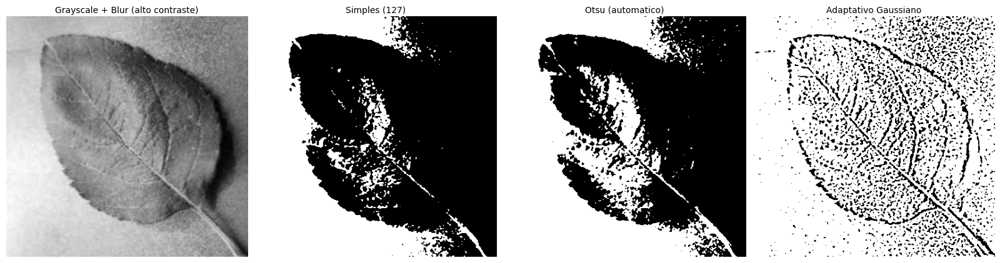

In [10]:
gray_blur = aplicar_blur_gaussiano(gray, kernel=(5, 5))   # preservado para analise A vs B

# Demo com imagem de alto contraste (bimodalidade maxima — Otsu segmenta melhor)
gray_blur_c = aplicar_blur_gaussiano(converter_grayscale(IMG_CONTRAST), kernel=(5, 5))
t_simples_c = aplicar_threshold_simples(gray_blur_c, valor=127)
t_otsu_c    = aplicar_threshold_otsu(gray_blur_c)
t_adapt_c   = aplicar_threshold_adaptativo_gaussiano(gray_blur_c, block_size=15, C=4)

grade(
    [gray_blur_c, t_simples_c, t_otsu_c, t_adapt_c],
    ['Grayscale + Blur (alto contraste)', 'Simples (127)', 'Otsu (automatico)', 'Adaptativo Gaussiano'],
    cols=4, figsize=(16, 4),
    nome='02_threshold_comparacao.png',
)

In [11]:
sep('Analise: Limiarizacao (Threshold)')

retval, _ = cv2.threshold(gray_blur_c, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
limiar_otsu = int(retval)
total_px = gray_blur_c.shape[0] * gray_blur_c.shape[1]
px_s = int(t_simples_c.sum()) // 255
px_o = int(t_otsu_c.sum()) // 255
px_a = int(t_adapt_c.sum()) // 255

print(f'Limiar Otsu calculado automaticamente: {limiar_otsu}')
print(f'  pixels > {limiar_otsu} -> branco  |  pixels <= {limiar_otsu} -> preto')
print()
print(f'Pixels brancos de {total_px:,} total:')
print(f'  Simples (127 fixo) : {px_s:>7,}  ({px_s/total_px*100:.1f}%)')
print(f'  Otsu               : {px_o:>7,}  ({px_o/total_px*100:.1f}%)')
print(f'  Adaptativo         : {px_a:>7,}  ({px_a/total_px*100:.1f}%)')
print()
print('Como cada metodo decide o limiar:')
print('  Simples   : valor manual (127). Falha se a imagem for mais clara/escura.')
print('  Otsu      : analisa o histograma e escolhe o T que minimiza a variancia')
print('              intraclasse. Automatico e especifico para esta imagem.')
print('  Adaptativo: limiar por bloco (15x15) -> captura variacao local de luz e')
print('              textura fina das manchas. Tende a marcar mais pixels.')


  Analise: Limiarizacao (Threshold)
Limiar Otsu calculado automaticamente: 117
  pixels > 117 -> branco  |  pixels <= 117 -> preto

Pixels brancos de 173,056 total:
  Simples (127 fixo) :  65,795  (38.0%)
  Otsu               :  81,676  (47.2%)
  Adaptativo         : 144,415  (83.4%)

Como cada metodo decide o limiar:
  Simples   : valor manual (127). Falha se a imagem for mais clara/escura.
  Otsu      : analisa o histograma e escolhe o T que minimiza a variancia
              intraclasse. Automatico e especifico para esta imagem.
  Adaptativo: limiar por bloco (15x15) -> captura variacao local de luz e
              textura fina das manchas. Tende a marcar mais pixels.


  Salvo -> results/03_threshold_amostras.png


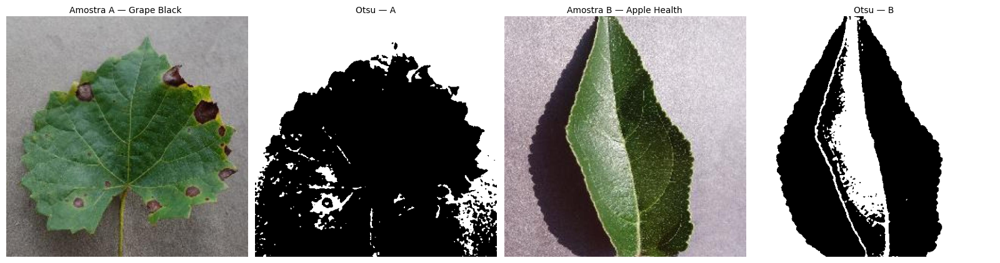


  Analise: Otsu entre duas amostras
  Amostra A :  65,928 px brancos
  Amostra B : 107,300 px brancos  (+62.8% vs A)

Analise por tipo de doenca deste dataset:
  Grape black rot      -> lesao ESCURA: aparece como pixels PRETOS no Otsu
  Apple cedar rust     -> lesao LARANJA: intensidade media; Otsu pode mesclar com folha
  Cherry powdery mildew-> po BRANCO: aparece como pixels BRANCOS no Otsu (facil)
  Tomato septoria      -> manchas MISTAS (centro claro + borda escura): Adaptativo
                          captura melhor por ajustar o limiar localmente

Conclusao do Bloco 1:
  Threshold NAO localiza a doenca especifica nem identifica a classe.
  Grape black rot e Cherry powdery mildew sao mais separaveis por intensidade;
  Apple cedar rust e Tomato septoria exigem cor (HSV, Bloco 3) ou aprendizado (YOLO, Bloco 4).


In [12]:
otsu_a = aplicar_threshold_otsu(aplicar_blur_gaussiano(converter_grayscale(IMG_A)))
otsu_b = aplicar_threshold_otsu(aplicar_blur_gaussiano(converter_grayscale(IMG_B)))

grade(
    [IMG_A, otsu_a, IMG_B, otsu_b],
    [f'Amostra A — {NOME_A}'[:24], 'Otsu — A', f'Amostra B — {NOME_B}'[:24], 'Otsu — B'],
    cols=4, figsize=(16, 4),
    nome='03_threshold_amostras.png',
)

sep('Analise: Otsu entre duas amostras')
pa = int(otsu_a.sum()) // 255
pb = int(otsu_b.sum()) // 255
print(f'  Amostra A : {pa:>7,} px brancos')
print(f'  Amostra B : {pb:>7,} px brancos  ({(pb/pa-1)*100:+.1f}% vs A)')
print()
print('Analise por tipo de doenca deste dataset:')
print('  Grape black rot      -> lesao ESCURA: aparece como pixels PRETOS no Otsu')
print('  Apple cedar rust     -> lesao LARANJA: intensidade media; Otsu pode mesclar com folha')
print('  Cherry powdery mildew-> po BRANCO: aparece como pixels BRANCOS no Otsu (facil)')
print('  Tomato septoria      -> manchas MISTAS (centro claro + borda escura): Adaptativo')
print('                          captura melhor por ajustar o limiar localmente')
print()
print('Conclusao do Bloco 1:')
print('  Threshold NAO localiza a doenca especifica nem identifica a classe.')
print('  Grape black rot e Cherry powdery mildew sao mais separaveis por intensidade;')
print('  Apple cedar rust e Tomato septoria exigem cor (HSV, Bloco 3) ou aprendizado (YOLO, Bloco 4).')

---
## 3 · Bloco 2 — Edge & Corner Detection

Bordas (Canny, Sobel) e cantos (Harris, Shi-Tomasi) para identificar estruturas:
bordas das lesões, nervuras e contornos da folha.

  Salvo -> results/04_canny.png


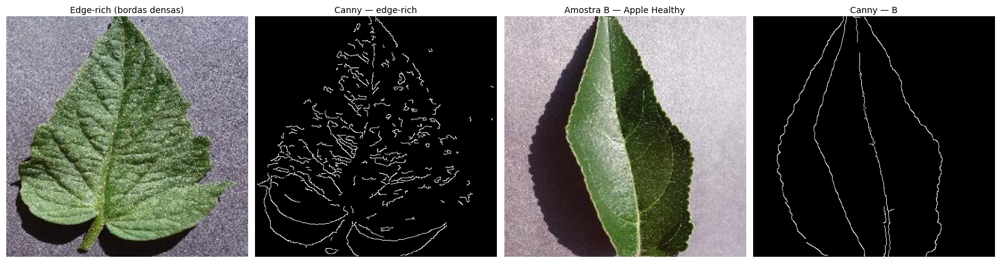

In [13]:
canny_a    = detectar_bordas_canny(IMG_A)   # preservado para o resumo do Bloco 2
canny_b    = detectar_bordas_canny(IMG_B)
canny_edge = detectar_bordas_canny(IMG_EDGE)  # imagem de bordas densas — melhor demo

grade(
    [IMG_EDGE, canny_edge, IMG_B, canny_b],
    ['Edge-rich (bordas densas)', 'Canny — edge-rich',
     f'Amostra B — {NOME_B}'[:28], 'Canny — B'],
    cols=4, figsize=(16, 4),
    nome='04_canny.png',
)

In [14]:
sep('Analise: Canny')

bordas_edge = int((canny_edge > 0).sum())
bordas_b    = int((canny_b > 0).sum())
npx = TAMANHO[0] * TAMANHO[1]

med_edge = int(np.median(cv2.blur(converter_grayscale(IMG_EDGE), (5, 5))))
med_b    = int(np.median(cv2.blur(converter_grayscale(IMG_B),    (5, 5))))

print('Como o Canny funciona (4 etapas):')
print('  1. Gaussian blur       -> remove ruido para evitar falsas bordas')
print('  2. Gradiente Sobel     -> calcula a variacao de intensidade (dx, dy)')
print('  3. Non-max suppression -> afina as bordas para 1 pixel')
print('  4. Histerese (T1, T2)  -> T1 fixa bordas fortes; T2 conecta as fracas')
print()
print('Thresholds automaticos pela mediana (T1=0.7*med, T2=1.3*med):')
print(f'  Edge-rich: mediana={med_edge}  T1={int(0.7*med_edge)}  T2={int(1.3*med_edge)}')
print(f'  Amostra B: mediana={med_b}  T1={int(0.7*med_b)}  T2={int(1.3*med_b)}')
print()
print('Pixels de borda detectados:')
print(f'  Edge-rich : {bordas_edge:>6,}  ({bordas_edge/npx*100:.1f}% da imagem)')
print(f'  Amostra B : {bordas_b:>6,}  ({bordas_b/npx*100:.1f}% da imagem)')
print()
print('Interpretacao para este dataset:')
print('  Grape black rot e Tomato septoria -> bordas nitidas entre lesao e tecido saudavel')
print('                                       -> Canny detecta bem o contorno da lesao')
print('  Cherry powdery mildew             -> po difuso sem borda definida')
print('                                       -> menos pixels de borda, Canny menos eficaz')
print('  Apple cedar rust                  -> transicao de cor gradual (laranja -> verde)')
print('                                       -> Canny captura nervuras mais que a lesao em si')


  Analise: Canny
Como o Canny funciona (4 etapas):
  1. Gaussian blur       -> remove ruido para evitar falsas bordas
  2. Gradiente Sobel     -> calcula a variacao de intensidade (dx, dy)
  3. Non-max suppression -> afina as bordas para 1 pixel
  4. Histerese (T1, T2)  -> T1 fixa bordas fortes; T2 conecta as fracas

Thresholds automaticos pela mediana (T1=0.7*med, T2=1.3*med):
  Edge-rich: mediana=128  T1=89  T2=166
  Amostra B: mediana=158  T1=110  T2=205

Pixels de borda detectados:
  Edge-rich :  6,480  (3.7% da imagem)
  Amostra B :  2,274  (1.3% da imagem)

Interpretacao para este dataset:
  Grape black rot e Tomato septoria -> bordas nitidas entre lesao e tecido saudavel
                                       -> Canny detecta bem o contorno da lesao
  Cherry powdery mildew             -> po difuso sem borda definida
                                       -> menos pixels de borda, Canny menos eficaz
  Apple cedar rust                  -> transicao de cor gradual (laranja -> verd

  Salvo -> results/05_sobel.png


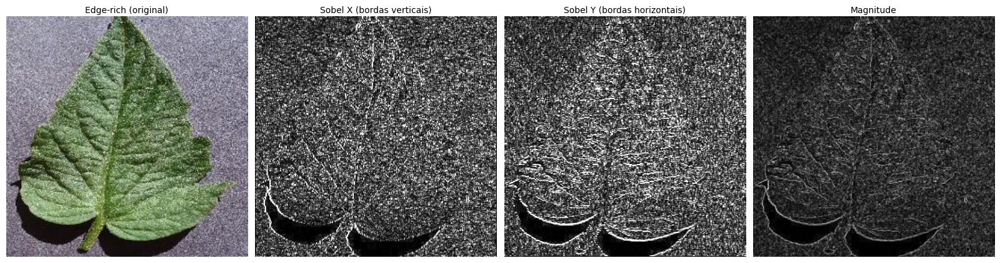

In [15]:
mag, sx, sy = detectar_bordas_sobel(IMG_EDGE)   # imagem edge-rich para demo clara

grade(
    [IMG_EDGE, sx, sy, mag],
    ['Edge-rich (original)', 'Sobel X (bordas verticais)', 'Sobel Y (bordas horizontais)', 'Magnitude'],
    cols=4, figsize=(16, 4),
    nome='05_sobel.png',
)

In [16]:
sep('Analise: Sobel')

mag_b, _, _ = detectar_bordas_sobel(IMG_B)

print('Como o Sobel funciona:')
print('  Dois kernels 3x3 de convolucao:')
print('    Sobel X = [[-1 0 +1],[-2 0 +2],[-1 0 +1]]  -> bordas verticais')
print('    Sobel Y = transposta de Sobel X            -> bordas horizontais')
print('  Magnitude = sqrt(Gx^2 + Gy^2) -> forca do gradiente')
print('  Angulo    = atan2(Gy, Gx)     -> direcao da borda')
print()
print('Magnitude media do gradiente:')
print(f'  Edge-rich : {mag.mean():.2f}')
print(f'  Amostra B : {mag_b.mean():.2f}  ({(mag_b.mean()/mag.mean()-1)*100:+.1f}% vs edge-rich)')
print()
print('Histograma de intensidade do gradiente (Edge-rich):')
hist, bins = np.histogram(mag.ravel(), bins=5, range=(0, 255))
for i in range(len(hist)):
    barra = 'x' * (hist[i] // max(1, hist.max() // 30))
    print(f'  [{int(bins[i]):>3}-{int(bins[i+1]):>3}]  {hist[i]:>7,}  {barra}')
print()
print('A maioria dos pixels tem gradiente baixo (regioes uniformes: fundo,')
print('tecido liso). Picos intermediarios = nervuras e bordas de lesoes.')
print(f'Edge-rich escolhida por ter a maior soma de Canny ({int((canny_edge>0).sum()):,} px),')
print('o que confirma a densidade de bordas visivel no Sobel.')


  Analise: Sobel
Como o Sobel funciona:
  Dois kernels 3x3 de convolucao:
    Sobel X = [[-1 0 +1],[-2 0 +2],[-1 0 +1]]  -> bordas verticais
    Sobel Y = transposta de Sobel X            -> bordas horizontais
  Magnitude = sqrt(Gx^2 + Gy^2) -> forca do gradiente
  Angulo    = atan2(Gy, Gx)     -> direcao da borda

Magnitude media do gradiente:
  Edge-rich : 45.71
  Amostra B : 20.72  (-54.7% vs edge-rich)

Histograma de intensidade do gradiente (Edge-rich):
  [  0- 51]  108,300  xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
  [ 51-102]   56,178  xxxxxxxxxxxxxxx
  [102-153]    7,922  xx
  [153-204]      634  
  [204-255]       22  

A maioria dos pixels tem gradiente baixo (regioes uniformes: fundo,
tecido liso). Picos intermediarios = nervuras e bordas de lesoes.
Edge-rich escolhida por ter a maior soma de Canny (6,480 px),
o que confirma a densidade de bordas visivel no Sobel.


  Salvo -> results/06_cantos.png


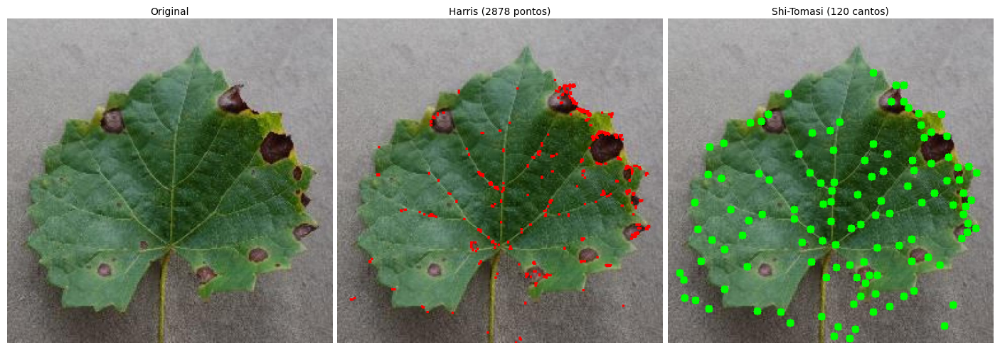

In [17]:
img_harris,    n_h = detectar_cantos_harris(IMG_A)
img_shitomasi, n_s = detectar_cantos_shi_tomasi(IMG_A, max_cantos=120)

grade(
    [IMG_A, img_harris, img_shitomasi],
    ['Original', f'Harris ({n_h} pontos)', f'Shi-Tomasi ({n_s} cantos)'],
    cols=3, figsize=(14, 5),
    nome='06_cantos.png',
)

In [18]:
sep('Analise: Harris e Shi-Tomasi')

_, n_h_b = detectar_cantos_harris(IMG_B)
_, n_s_b = detectar_cantos_shi_tomasi(IMG_B, max_cantos=120)

print('Harris:')
print('  Para cada pixel monta a matriz M de auto-correlacao 2x2.')
print('  R = det(M) - k * trace(M)^2   (k = 0.04)')
print('  R >> 0 -> canto | R << 0 -> borda | R ~ 0 -> regiao plana')
print()
print('Shi-Tomasi:')
print('  Usa min(autovalor1, autovalor2) em vez de det/trace.')
print('  E mais estavel e e o padrao do goodFeaturesToTrack do OpenCV.')
print()
print(f'Cantos Harris:     A = {n_h:>5,}   |   B = {n_h_b:>5,}')
print(f'Cantos Shi-Tomasi: A = {n_s:>5}   |   B = {n_s_b:>5}  (limite=120)')
print()
print('Cantos concentram-se em junçoes de nervuras e nos contornos irregulares')
print('das manchas — pontos uteis como features para rastreamento/registro.')


  Analise: Harris e Shi-Tomasi
Harris:
  Para cada pixel monta a matriz M de auto-correlacao 2x2.
  R = det(M) - k * trace(M)^2   (k = 0.04)
  R >> 0 -> canto | R << 0 -> borda | R ~ 0 -> regiao plana

Shi-Tomasi:
  Usa min(autovalor1, autovalor2) em vez de det/trace.
  E mais estavel e e o padrao do goodFeaturesToTrack do OpenCV.

Cantos Harris:     A = 2,878   |   B = 12,888
Cantos Shi-Tomasi: A =   120   |   B =   120  (limite=120)

Cantos concentram-se em junçoes de nervuras e nos contornos irregulares
das manchas — pontos uteis como features para rastreamento/registro.


  Salvo -> results/07_contornos.png


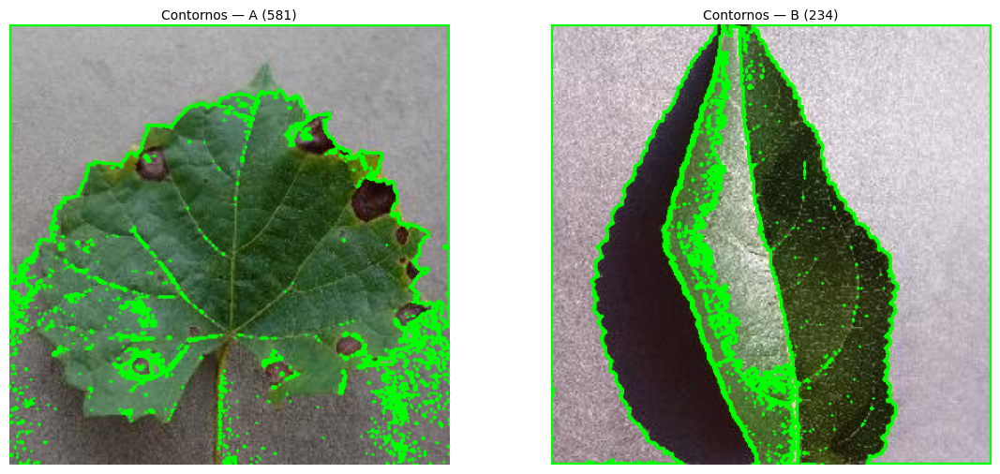


  Resumo do Bloco 2
  Metrica                    Edge-rich     Amostra B
  --------------------------------------------------
  Canny (bordas)                 6,480         2,274
  Sobel (grad. medio)            45.71         20.72
  Harris (cantos — A/B)          2,878        12,888
  Contornos — A/B                  581           234

Estes detectores medem ESTRUTURA, mas nao sabem onde esta a doenca.

Interpretacao para o Plant Disease Detection:
  Grape black rot e Tomato septoria -> contornos nitidos -> alto n. de bordas/cantos
  Cherry powdery mildew -> textura difusa -> menos bordas, mais cantos granulares
  Apple cedar rust      -> gradiente suave -> poucas bordas fortes
  Folhas saudaveis      -> bordas limitadas as nervuras; cantos nos nos das nervuras

Para isso usamos cor (HSV, Bloco 3) e aprendizado (YOLO, Bloco 4).


In [19]:
cont_a, n_ca = detectar_contornos_externos(IMG_A)
cont_b, n_cb = detectar_contornos_externos(IMG_B)

grade(
    [cont_a, cont_b],
    [f'Contornos — A ({n_ca})', f'Contornos — B ({n_cb})'],
    cols=2, figsize=(12, 5),
    nome='07_contornos.png',
)

sep('Resumo do Bloco 2')
# Canny/Sobel usam IMG_EDGE (demo edge-rich); Harris/Contornos usam IMG_A/IMG_B
print(f'  {"Metrica":<22}  {"Edge-rich":>12}  {"Amostra B":>12}')
print(f'  {"-"*50}')
print(f'  {"Canny (bordas)":<22}  {int((canny_edge>0).sum()):>12,}  {int((canny_b>0).sum()):>12,}')
print(f'  {"Sobel (grad. medio)":<22}  {mag.mean():>12.2f}  {mag_b.mean():>12.2f}')
print(f'  {"Harris (cantos — A/B)":<22}  {n_h:>12,}  {n_h_b:>12,}')
print(f'  {"Contornos — A/B":<22}  {n_ca:>12}  {n_cb:>12}')
print()
print('Estes detectores medem ESTRUTURA, mas nao sabem onde esta a doenca.')
print()
print('Interpretacao para o Plant Disease Detection:')
print('  Grape black rot e Tomato septoria -> contornos nitidos -> alto n. de bordas/cantos')
print('  Cherry powdery mildew -> textura difusa -> menos bordas, mais cantos granulares')
print('  Apple cedar rust      -> gradiente suave -> poucas bordas fortes')
print('  Folhas saudaveis      -> bordas limitadas as nervuras; cantos nos nos das nervuras')
print()
print('Para isso usamos cor (HSV, Bloco 3) e aprendizado (YOLO, Bloco 4).')

---
## 4 · Bloco 3 — Detecção de Objeto + ROI + Blend/Paste

Segmentação por cor (HSV) para isolar a folha e as manchas de doença.
Composição visual (máscara, blend colorido, ROI) e comparação das caixas HSV
contra o **ground-truth** do dataset.

  Salvo -> results/08_segmentacao_folha.png


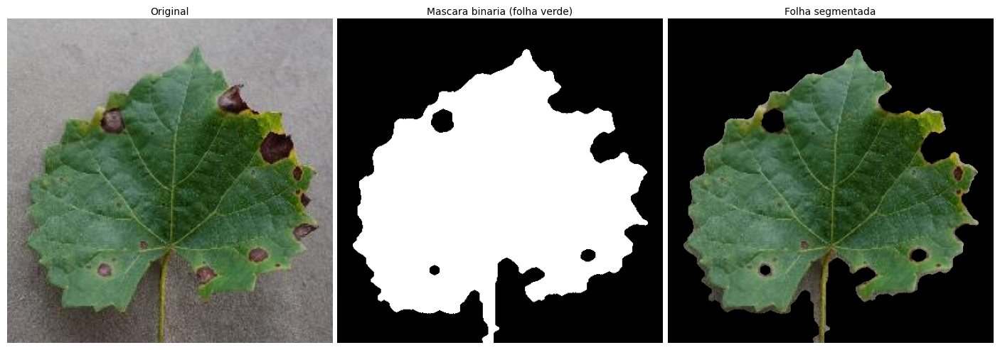


  Analise: Segmentacao HSV da folha
Passos: RGB->HSV; cv2.inRange no verde; morfologia CLOSE (fecha buracos)
e OPEN (remove ruido). HSV separa TONALIDADE (Hue) de BRILHO (Value), o que
o torna robusto a sombras e variacao de luz — comum em fotos de campo.

  Total de pixels : 173,056  (416x416)
  Area da folha   : 81,941 px  (47.3%)
  Fundo/nao-folha : 91,115 px  (52.7%)


In [20]:
folha_seg, mascara_folha = segmentar_folha_verde(IMG_A)

grade(
    [IMG_A, mascara_folha, folha_seg],
    ['Original', 'Mascara binaria (folha verde)', 'Folha segmentada'],
    cols=3, figsize=(14, 5),
    nome='08_segmentacao_folha.png',
)

sep('Analise: Segmentacao HSV da folha')
total_px   = int(IMG_A.shape[0] * IMG_A.shape[1])
area_folha = int(mascara_folha.sum()) // 255
print('Passos: RGB->HSV; cv2.inRange no verde; morfologia CLOSE (fecha buracos)')
print('e OPEN (remove ruido). HSV separa TONALIDADE (Hue) de BRILHO (Value), o que')
print('o torna robusto a sombras e variacao de luz — comum em fotos de campo.')
print()
print(f'  Total de pixels : {total_px:,}  ({IMG_A.shape[1]}x{IMG_A.shape[0]})')
print(f'  Area da folha   : {area_folha:,} px  ({area_folha/total_px*100:.1f}%)')
print(f'  Fundo/nao-folha : {total_px-area_folha:,} px  ({(total_px-area_folha)/total_px*100:.1f}%)')

  Salvo -> results/09_lesoes_hsv.png


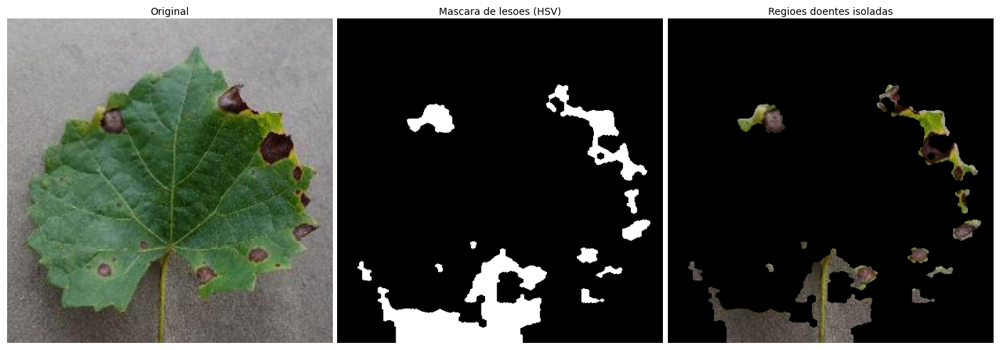

Lesoes detectadas pelo HSV: 11


In [21]:
mascara_lesao, img_lesao, n_lesoes, bboxes = detectar_lesoes_hsv(IMG_A, sensibilidade='media')

grade(
    [IMG_A, mascara_lesao, img_lesao],
    ['Original', 'Mascara de lesoes (HSV)', 'Regioes doentes isoladas'],
    cols=3, figsize=(14, 5),
    nome='09_lesoes_hsv.png',
)
print(f"Lesoes detectadas pelo HSV: {n_lesoes}")

In [22]:
sep('Analise: Deteccao de Lesoes — HSV vs Ground-Truth')

area_lesao = int(mascara_lesao.sum()) // 255
pct_lesao  = area_lesao / area_folha * 100 if area_folha > 0 else 0.0

# Compara as caixas do HSV com as caixas reais do dataset (ground-truth)
hsv_xyxy = [(x, y, x + w, y + h) for (x, y, w, h) in bboxes]
gt_xyxy  = [(x1, y1, x2, y2) for (_, x1, y1, x2, y2) in GT_A]
m_hsv = casar_caixas(gt_xyxy, hsv_xyxy, iou_min=0.2)

print('Faixas HSV calibradas para lesoes (marrom / amarelo / alaranjado),')
print('unidas por OR; pos-processamento com OPEN/CLOSE e connectedComponents.')
print()
print(f'Resultados HSV:')
print(f'  Lesoes detectadas    : {n_lesoes}')
print(f'  Area lesionada       : {area_lesao:,} px  ({pct_lesao:.1f}% da folha)')
print()
print(f'Comparacao com o ground-truth ({m_hsv["n_gt"]} caixas reais), IoU>=0.2:')
print(f'  Acertos (TP)         : {m_hsv["tp"]}')
print(f'  Recall (cobertura)   : {m_hsv["recall"]*100:.1f}%')
print(f'  Precision            : {m_hsv["precision"]*100:.1f}%')
print(f'  IoU medio dos acertos: {m_hsv["iou_medio"]:.2f}')
print()
print('Analise por classe do dataset (Plant Disease Detection, 8 classes):')
print()
print('  DETECTAVEL pelo HSV (faixa marrom/laranja/amarelo calibrada):')
print('    [+] Apple cedar rust     -> manchas laranja/ferrugem -> Hue ~10-25 deg')
print('    [+] Grape black rot      -> lesoes escuras com halo marrom -> H ~0-20 deg')
print('    [+] Tomato septoria      -> borda marrom-escura ao redor do centro claro')
print()
print('  DIFICIL para o HSV:')
print('    [-] Cherry powdery mildew -> po branco/cinza -> Hue indefinido, S baixo')
print('    [-] Tomato septoria centro -> centro claro (esbranquicado) -> fora do range')
print('    [-] Classes saudaveis      -> podem ter folhas amarelando -> falso positivo')
print()
print(f'  Recall atual HSV   : {m_hsv["recall"]*100:.1f}%  (quantas lesoes reais foram cobertas)')
print(f'  Precision atual HSV: {m_hsv["precision"]*100:.1f}%  (das caixas geradas, quantas eram lesao)')
print(f'  IoU medio          : {m_hsv["iou_medio"]:.2f}')
print()
print('Limitacao do HSV: a faixa de Hue fixa nao generaliza para todas as doencas.')
print('Cherry powdery mildew (branco) e partes claras da Tomato septoria escapam.')
print('O YOLO treinado aprende cada classe independentemente -> vantagem clara no Bloco 4.')


  Analise: Deteccao de Lesoes — HSV vs Ground-Truth
Faixas HSV calibradas para lesoes (marrom / amarelo / alaranjado),
unidas por OR; pos-processamento com OPEN/CLOSE e connectedComponents.

Resultados HSV:
  Lesoes detectadas    : 11
  Area lesionada       : 17,597 px  (21.5% da folha)

Comparacao com o ground-truth (20 caixas reais), IoU>=0.2:
  Acertos (TP)         : 6
  Recall (cobertura)   : 30.0%
  Precision            : 54.5%
  IoU medio dos acertos: 0.53

Analise por classe do dataset (Plant Disease Detection, 8 classes):

  DETECTAVEL pelo HSV (faixa marrom/laranja/amarelo calibrada):
    [+] Apple cedar rust     -> manchas laranja/ferrugem -> Hue ~10-25 deg
    [+] Grape black rot      -> lesoes escuras com halo marrom -> H ~0-20 deg
    [+] Tomato septoria      -> borda marrom-escura ao redor do centro claro

  DIFICIL para o HSV:
    [-] Cherry powdery mildew -> po branco/cinza -> Hue indefinido, S baixo
    [-] Tomato septoria centro -> centro claro (esbranquicado) -> for

  Salvo -> results/10_blend_paste.png


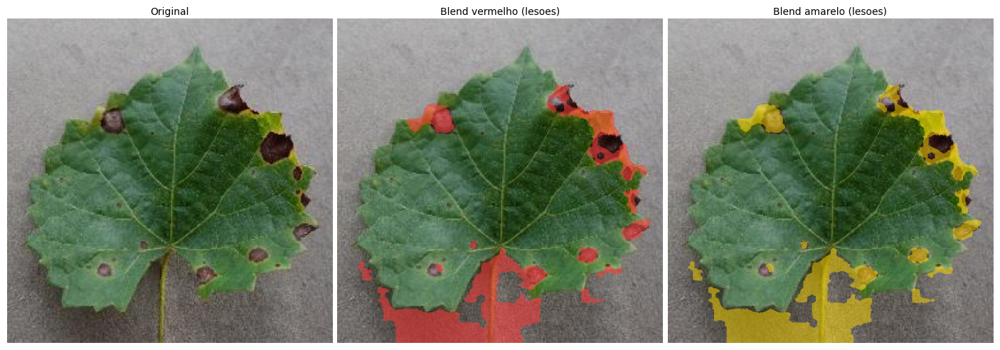


  Analise: Blend/Paste (alpha compositing)
  pixel_final = original * (1 - alpha*mascara) + cor_destaque * (alpha*mascara)
  mascara=0 (fora da lesao): mantem o pixel original
  mascara=1 (dentro): mistura original + cor de destaque
  Mesma tecnica de "Blending and Pasting Images" das aulas: composicao
  de duas imagens por multiplicacao com mascara binaria.


In [23]:
blend_r = destacar_regiao_doenca(IMG_A, mascara_lesao, cor_destaque=(255,  60,  60))
blend_y = destacar_regiao_doenca(IMG_A, mascara_lesao, cor_destaque=(255, 220,   0), alpha=0.5)

grade(
    [IMG_A, blend_r, blend_y],
    ['Original', 'Blend vermelho (lesoes)', 'Blend amarelo (lesoes)'],
    cols=3, figsize=(14, 5),
    nome='10_blend_paste.png',
)

sep('Analise: Blend/Paste (alpha compositing)')
print('  pixel_final = original * (1 - alpha*mascara) + cor_destaque * (alpha*mascara)')
print('  mascara=0 (fora da lesao): mantem o pixel original')
print('  mascara=1 (dentro): mistura original + cor de destaque')
print('  Mesma tecnica de "Blending and Pasting Images" das aulas: composicao')
print('  de duas imagens por multiplicacao com mascara binaria.')

  Salvo -> results/11_diagnostico_roi.png


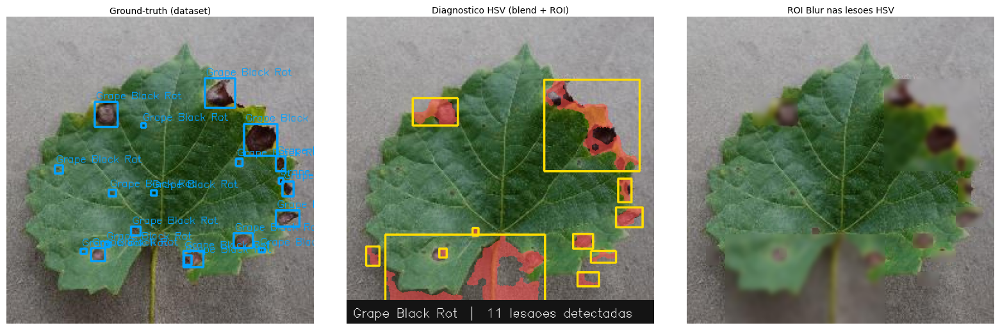


  Analise: ROI (Region of Interest)
ROI = recorte retangular onde aplicamos uma operacao: img[y:y+h, x:x+w].
Blur por ROI: recorta a regiao, suaviza e cola de volta.
  11 bounding boxes processadas pelo HSV:
  Lesao 1: x=267 y=85 w=129 h=124  area=15996 px
  Lesao 2: x=89 y=110 w=61 h=37  area=2257 px
  Lesao 3: x=367 y=219 w=18 h=32  area=576 px
  Lesao 4: x=364 y=258 w=36 h=27  area=972 px
  Lesao 5: x=170 y=286 w=8 h=10  area=80 px
  Lesao 6: x=52 y=295 w=216 h=121  area=26136 px
  Lesao 7: x=306 y=294 w=27 h=20  area=540 px
  Lesao 8: x=26 y=311 w=18 h=26  area=468 px
  Lesao 9: x=125 y=314 w=10 h=12  area=120 px
  Lesao 10: x=330 y=317 w=34 h=16  area=544 px
  Lesao 11: x=312 y=346 w=29 h=19  area=551 px


In [24]:
diagnostico = compor_diagnostico_visual(IMG_A, mascara_lesao, bboxes, NOME_A)

img_roi_blur = IMG_A.copy()
for (x, y, w, h) in bboxes:
    img_roi_blur = aplicar_blur_em_roi(img_roi_blur, x, y, w, h, ksize=(21, 21))

grade(
    [desenhar_boxes(IMG_A, GT_A, CLASSES), diagnostico, img_roi_blur],
    ['Ground-truth (dataset)', 'Diagnostico HSV (blend + ROI)', 'ROI Blur nas lesoes HSV'],
    cols=3, figsize=(16, 5),
    nome='11_diagnostico_roi.png',
)

sep('Analise: ROI (Region of Interest)')
print('ROI = recorte retangular onde aplicamos uma operacao: img[y:y+h, x:x+w].')
print('Blur por ROI: recorta a regiao, suaviza e cola de volta.')
print(f'  {len(bboxes)} bounding boxes processadas pelo HSV:')
for i, (x, y, w, h) in enumerate(bboxes):
    print(f'  Lesao {i+1}: x={x} y={y} w={w} h={h}  area={w*h} px')

---
## 5 · Bloco 4 — YOLOv8 (Detecção) treinado no dataset

Treinamos o **YOLOv8n** para **localizar e classificar** as lesões (bounding boxes),
usando as anotações reais do dataset. Depois comparamos com o método clássico HSV
e medimos a qualidade contra o *ground-truth* (recall / precisão / IoU).

> Pipeline: preparar `data.yaml` → treinar → inferir → comparar HSV × YOLO × GT.

In [25]:
sep('Treinamento YOLOv8n (deteccao)')

import shutil

DATA_YAML   = preparar_yaml_treino()
MODELOS_DIR = os.path.join(str(ROOT), 'models')      # modelos na RAIZ do projeto
os.makedirs(MODELOS_DIR, exist_ok=True)

MODELO_BASE     = os.path.join(MODELOS_DIR, 'yolov8n.pt')
MODELO_TREINADO = os.path.join(MODELOS_DIR, 'plant_disease_best.pt')
EPOCAS          = 30                                  # ajuste conforme tempo/hardware

print('data.yaml de treino:', DATA_YAML)
print('Modelos salvos em  :', MODELOS_DIR)

if os.path.exists(MODELO_TREINADO):
    print('Modelo ja treinado encontrado:', MODELO_TREINADO)
    modelo = carregar_modelo_custom(MODELO_TREINADO)
else:
    import torch as _torch
    _device = 0 if _torch.cuda.is_available() else 'cpu'
    print(f'Iniciando treinamento ({EPOCAS} epocas) — device: {_device}')
    print('Tempo estimado: ~20-40 min com GPU | varias horas sem CPU')
    _cwd = os.getcwd()
    os.chdir(str(ROOT))   # base weights e runs ficam na RAIZ, nao em notebook/
    try:
        modelo, _ = treinar_detector(
            DATA_YAML, epocas=EPOCAS, imgsz=640, batch=16,
            modelo_base=MODELO_BASE,
            nome_experimento='plant_disease',
            project=os.path.join(MODELOS_DIR, 'runs'),
            device=_device,
        )
        # Em Ultralytics 8.x o save_dir fica no trainer do modelo
        _run_dir = str(modelo.trainer.save_dir)
    except AttributeError:
        # Fallback: localiza a run mais recente na pasta de runs
        import glob as _g
        _candidatos = sorted(_g.glob(
            os.path.join(MODELOS_DIR, 'runs', 'plant_disease*', 'weights', 'best.pt')))
        if not _candidatos:
            raise FileNotFoundError('best.pt nao encontrado apos treinamento.')
        _run_dir = os.path.dirname(os.path.dirname(_candidatos[-1]))
    finally:
        os.chdir(_cwd)
    best = os.path.join(_run_dir, 'weights', 'best.pt')
    shutil.copy(best, MODELO_TREINADO)
    print('Treinamento concluido. Pesos salvos em:', MODELO_TREINADO)
    modelo = carregar_modelo_custom(MODELO_TREINADO)

print('Modelo pronto para inferencia.')


  Treinamento YOLOv8n (deteccao)
data.yaml de treino: c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\data\data_treino.yaml
Modelos salvos em  : c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\models
Iniciando treinamento (30 epocas) — device: 0
Tempo estimado: ~20-40 min com GPU | varias horas sem CPU
Ultralytics 8.4.56  Python-3.13.9 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\data\data_treino.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fr

  Salvo -> results/13_yolo_deteccao.png


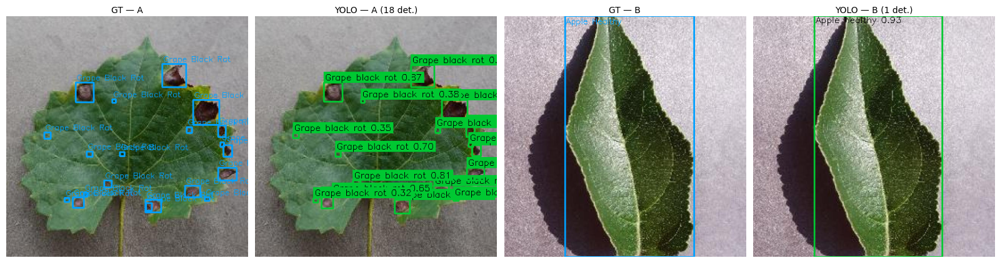

Deteccoes YOLO — Amostra A (18):
  Grape black rot              conf=0.92  area=546 px
  Grape black rot              conf=0.92  area=1848 px
  Grape black rot              conf=0.91  area=660 px
  Grape black rot              conf=0.90  area=380 px
  Grape black rot              conf=0.87  area=1056 px
  Grape black rot              conf=0.85  area=280 px
  Grape black rot              conf=0.85  area=624 px
  Grape black rot              conf=0.81  area=169 px
  Grape black rot              conf=0.79  area=1520 px
  Grape black rot              conf=0.74  area=285 px
  Grape black rot              conf=0.70  area=81 px
  Grape black rot              conf=0.65  area=48 px
  Grape black rot              conf=0.65  area=54 px
  Grape black rot              conf=0.40  area=56 px
  Grape black rot              conf=0.38  area=36 px
  Grape black rot              conf=0.35  area=90 px
  Grape black rot              conf=0.32  area=64 px
  Grape black rot              conf=0.25  area=72 px


In [26]:
# Inferencia do YOLO treinado na amostra principal e numa amostra extra
img_det_a, dets_a = detectar_objetos(IMG_A, modelo, confianca=0.25)
img_det_b, dets_b = detectar_objetos(IMG_B, modelo, confianca=0.25)

grade(
    [desenhar_boxes(IMG_A, GT_A, CLASSES), img_det_a,
     desenhar_boxes(IMG_B, GT_B, CLASSES), img_det_b],
    ['GT — A', f'YOLO — A ({len(dets_a)} det.)',
     'GT — B', f'YOLO — B ({len(dets_b)} det.)'],
    cols=4, figsize=(16, 4),
    nome='13_yolo_deteccao.png',
)

print(f'Deteccoes YOLO — Amostra A ({len(dets_a)}):')
for d in dets_a:
    x1, y1, x2, y2 = d['bbox']
    print(f"  {d['classe']:<28} conf={d['confianca']:.2f}  area={(x2-x1)*(y2-y1)} px")

In [27]:
sep('Analise: YOLO vs HSV vs Ground-Truth (Amostra A)')

yolo_xyxy = [d['bbox'] for d in dets_a]
m_yolo = casar_caixas(gt_xyxy, yolo_xyxy, iou_min=0.2)   # gt_xyxy/hsv vem do Bloco 3

print(f'Ground-truth: {m_hsv["n_gt"]} caixas reais.  Metrica de matching: IoU >= 0.2')
print()
print(f'  {"Metodo":<22}  {"Caixas":>6}  {"TP":>4}  {"Recall":>8}  {"Precision":>10}  {"IoU med":>8}')
print(f'  {"-"*68}')
print(f'  {"Classico HSV":<22}  {m_hsv["n_pred"]:>6}  {m_hsv["tp"]:>4}  '
      f'{m_hsv["recall"]*100:>7.1f}%  {m_hsv["precision"]*100:>9.1f}%  {m_hsv["iou_medio"]:>8.2f}')
print(f'  {"YOLOv8 (treinado)":<22}  {m_yolo["n_pred"]:>6}  {m_yolo["tp"]:>4}  '
      f'{m_yolo["recall"]*100:>7.1f}%  {m_yolo["precision"]*100:>9.1f}%  {m_yolo["iou_medio"]:>8.2f}')
print()
print('Leitura:')
print('  Recall    = quantas lesoes reais o metodo conseguiu cobrir.')
print('  Precision = quantas das caixas previstas eram realmente lesao.')
print('  IoU medio = o quao bem as caixas previstas se sobrepoem as reais.')
print()
if dets_a:
    classes_det = sorted({d["classe"] for d in dets_a})
    print('Vantagem do YOLO: identifica a CLASSE da doenca e detecta lesoes de')
    print('qualquer cor. Classes previstas nesta imagem:', classes_det)
else:
    print('YOLO nao detectou lesoes (conf<0.25). Treine mais epocas ou reduza a confianca.')
print('Vantagem do HSV: nao precisa de treino e da mascara pixel-a-pixel.')


  Analise: YOLO vs HSV vs Ground-Truth (Amostra A)
Ground-truth: 20 caixas reais.  Metrica de matching: IoU >= 0.2

  Metodo                  Caixas    TP    Recall   Precision   IoU med
  --------------------------------------------------------------------
  Classico HSV                11     6     30.0%       54.5%      0.53
  YOLOv8 (treinado)           18    18     90.0%      100.0%      0.88

Leitura:
  Recall    = quantas lesoes reais o metodo conseguiu cobrir.
  Precision = quantas das caixas previstas eram realmente lesao.
  IoU medio = o quao bem as caixas previstas se sobrepoem as reais.

Vantagem do YOLO: identifica a CLASSE da doenca e detecta lesoes de
qualquer cor. Classes previstas nesta imagem: ['Grape black rot']
Vantagem do HSV: nao precisa de treino e da mascara pixel-a-pixel.


  Salvo -> results/14_yolo_vs_classico.png


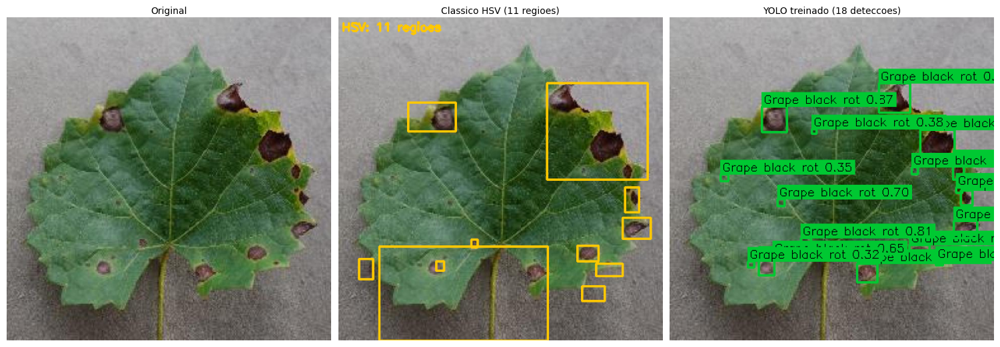

In [28]:
# Comparacao visual final: Original | HSV | YOLO
img_hsv_bbox = IMG_A.copy()
for (x, y, w, h) in bboxes:
    cv2.rectangle(img_hsv_bbox, (x, y), (x + w, y + h), (255, 200, 0), 2)
cv2.putText(img_hsv_bbox, f'HSV: {len(bboxes)} regioes', (4, 18),
            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 200, 0), 2)

grade(
    [IMG_A, img_hsv_bbox, img_det_a],
    ['Original',
     f'Classico HSV ({len(bboxes)} regioes)',
     f'YOLO treinado ({len(dets_a)} deteccoes)'],
    cols=3, figsize=(15, 5),
    nome='14_yolo_vs_classico.png',
)

  Salvo -> results/15_yolo_teste_lote.png


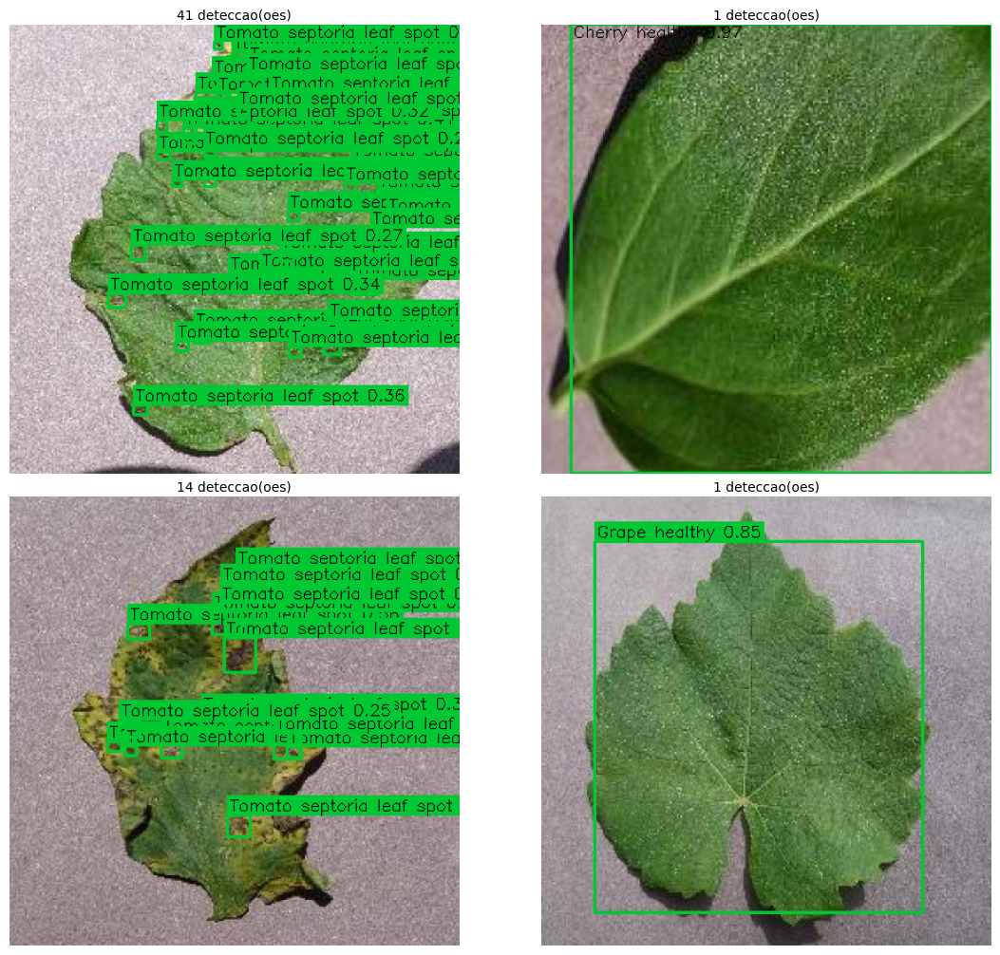

In [29]:
# Inferencia em lote no conjunto de teste
teste = amostrar_imagens(n=4, split='test', com_label=False, semente=3)
if not teste:
    teste = amostrar_imagens(n=4, split='valid', com_label=False, semente=3)

imgs_t, tits_t = [], []
for p in teste:
    im = cv2.resize(carregar_imagem_rgb(p), TAMANHO)
    det_im, dets = detectar_objetos(im, modelo, confianca=0.25)
    imgs_t.append(det_im)
    tits_t.append(f"{len(dets)} deteccao(oes)")

if imgs_t:
    grade(imgs_t, tits_t, cols=2, figsize=(12, 10), nome='15_yolo_teste_lote.png')

---
## 6 · Comparação: Método Clássico (HSV) vs YOLO

  Salvo -> results/16_comparacao_final.png


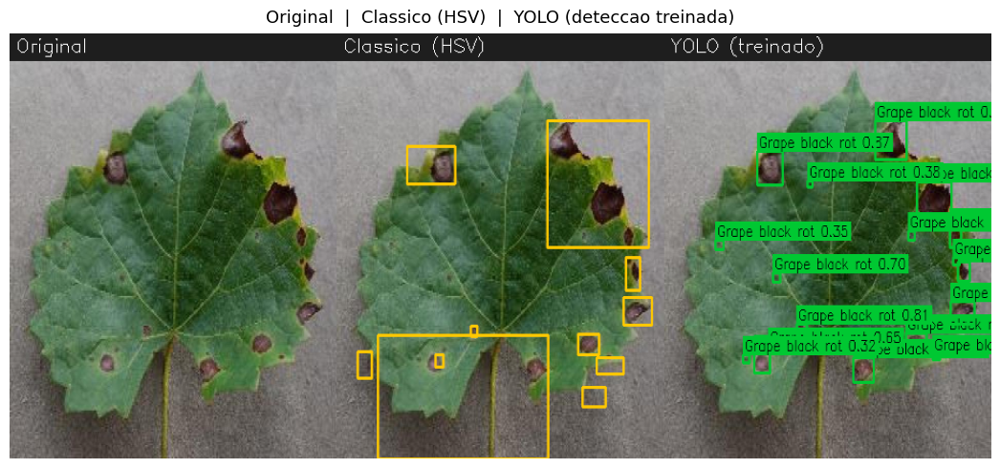

In [30]:
comparacao = comparar_metodos(
    IMG_A, img_hsv_bbox, img_det_a,
    label_classico='Classico (HSV)', label_yolo='YOLO (treinado)',
)

fig, ax = plt.subplots(figsize=(16, 5), dpi=100)
ax.imshow(comparacao); ax.axis('off')
ax.set_title('Original  |  Classico (HSV)  |  YOLO (deteccao treinada)', fontsize=13, pad=8)
plt.tight_layout()
fig.savefig(os.path.join(RESULTS_DIR, '16_comparacao_final.png'), bbox_inches='tight', dpi=100)
print('  Salvo -> results/16_comparacao_final.png')
plt.show(); plt.close(fig)

In [31]:
sep('Tabela Comparativa Final')

print(f'  {"Criterio":<30}  {"Classico (HSV)":<26}  {"YOLO (deteccao)"}')
print(f'  {"-"*82}')
linhas = [
    ('Objetivo',                 'Localizar lesoes',           'Localizar + classificar lesoes'),
    ('Saida',                    'Mascara px + bboxes',        'Bbox + classe + confianca'),
    ('Precisa de treinamento?',  'Nao',                        'Sim (dataset YOLO + GPU ideal)'),
    ('Identifica a doenca?',     'Nao',                        'Sim (classe por caixa)'),
    ('Detecta qualquer cor?',    'Nao (faixa HSV fixa)',       'Sim (aprende dos exemplos)'),
    ('Sensivel a iluminacao',    'Sim (HSV calibrado)',        'Menos (aprende invariancias)'),
    ('Velocidade',               'Muito rapida',               'Rapida (~ms/imagem)'),
    ('Interpretabilidade',       'Alta (mascara visual)',      'Media (bbox + conf)'),
    ('Funciona sem GPU',         'Sim',                        'Inferencia sim; treino lento'),
]
for crit, clas, yolo in linhas:
    print(f'  {crit:<30}  {clas:<26}  {yolo}')
print()
print('Analise especifica para o Plant Disease Detection (8 classes, 4000 imagens):')
print()
print('  HSV detecta bem   : Apple cedar rust, Grape black rot, borda Tomato septoria')
print('  HSV falha          : Cherry powdery mildew (branco), centro Tomato septoria')
print('  YOLO detecta todas : aprende cada classe independentemente pelo ground-truth')
print()
print(f'  YOLO — Caixas: {m_yolo["n_pred"]}  TP: {m_yolo["tp"]}  Recall: {m_yolo["recall"]*100:.1f}%  Precision: {m_yolo["precision"]*100:.1f}%  IoU: {m_yolo["iou_medio"]:.2f}')
print(f'  HSV  — Caixas: {m_hsv["n_pred"]}  TP: {m_hsv["tp"]}  Recall: {m_hsv["recall"]*100:.1f}%  Precision: {m_hsv["precision"]*100:.1f}%  IoU: {m_hsv["iou_medio"]:.2f}')
print()
print('Conclusao: o HSV funciona para doencas de cor previsivel (laranja/marrom),')
print('mas nao nomeia a doenca nem detecta Cherry powdery mildew (branco/cinza).')
print('O YOLO (YOLOv8n, 30 epocas, dataset Roboflow) localiza E classifica as 4')
print('doencas (cedar rust, powdery mildew, black rot, septoria leaf spot) com')
print('precisao mensuravel por IoU/recall, a custo de treinamento supervisionado.')


  Tabela Comparativa Final
  Criterio                        Classico (HSV)              YOLO (deteccao)
  ----------------------------------------------------------------------------------
  Objetivo                        Localizar lesoes            Localizar + classificar lesoes
  Saida                           Mascara px + bboxes         Bbox + classe + confianca
  Precisa de treinamento?         Nao                         Sim (dataset YOLO + GPU ideal)
  Identifica a doenca?            Nao                         Sim (classe por caixa)
  Detecta qualquer cor?           Nao (faixa HSV fixa)        Sim (aprende dos exemplos)
  Sensivel a iluminacao           Sim (HSV calibrado)         Menos (aprende invariancias)
  Velocidade                      Muito rapida                Rapida (~ms/imagem)
  Interpretabilidade              Alta (mascara visual)       Media (bbox + conf)
  Funciona sem GPU                Sim                         Inferencia sim; treino lento

Analise especi

---
## 7 · Arquivos Gerados em `results/`

In [32]:
arquivos = sorted(f for f in os.listdir(RESULTS_DIR) if f.endswith(('.png', '.jpg')))
print(f"{'Arquivo':<46} {'Tamanho':>10}")
print('-' * 58)
for f in arquivos:
    tam = os.path.getsize(os.path.join(RESULTS_DIR, f)) / 1024
    print(f"  {f:<44} {tam:>6.1f} KB")
print()
print(f"Total: {len(arquivos)} arquivos em {RESULTS_DIR}")

Arquivo                                           Tamanho
----------------------------------------------------------
  00_amostras_dataset.png                      1611.7 KB
  00b_amostras_principais.png                   654.1 KB
  01_blur_comparacao.png                       1038.8 KB
  02_threshold_comparacao.png                   282.2 KB
  03_threshold_amostras.png                     543.5 KB
  04_canny.png                                  620.4 KB
  05_sobel.png                                  928.1 KB
  06_cantos.png                                 387.1 KB
  07_contornos.png                              668.5 KB
  08_segmentacao_folha.png                      354.1 KB
  09_lesoes_hsv.png                             355.1 KB
  10_blend_paste.png                            415.6 KB
  11_diagnostico_roi.png                        513.3 KB
  13_yolo_deteccao.png                          559.0 KB
  14_yolo_vs_classico.png                       425.1 KB
  15_yolo_teste_lote.png    